In [1]:
# 1. Install dependencies
!pip install efficientnet_pytorch timm scikit-learn tqdm

  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet_pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16477 sha256=bb2361029e76b241699582b7c3043c2658ded0da3c25e5c0d592bcb606402aac
  Stored in directory: /root/.cache/pip/wheels/9c/3f/43/e6271c7026fe08c185da2be23c98c8e87477d3db63f41f32ad
Successfully built efficientnet_pytorch


In [2]:
import os
import cv2
import io
import json
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import torchvision.transforms as transforms
from scipy.optimize import brentq
from scipy.interpolate import interp1d
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, roc_curve, precision_recall_curve,
    average_precision_score, brier_score_loss, confusion_matrix
)
from sklearn.calibration import calibration_curve
from tqdm.auto import tqdm
from efficientnet_pytorch import EfficientNet

# =====================================================================
# GLOBAL CONFIGURATION
# =====================================================================
# Set which output index corresponds to FAKE based on your training script
FAKE_CLASS_INDEX = 0   # 0 = Fake, 1 = Real

# =====================================================================
# 1. MODEL ARCHITECTURE
# =====================================================================

class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc1 = nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False)
        self.relu1 = nn.ReLU(inplace=True)
        self.fc2 = nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = self.fc2(self.relu1(self.fc1(self.avg_pool(x))))
        max_out = self.fc2(self.relu1(self.fc1(self.max_pool(x))))
        return self.sigmoid(avg_out + max_out)


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        padding = 3 if kernel_size == 7 else 1
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        return self.sigmoid(self.conv1(torch.cat([avg_out, max_out], dim=1)))


class CBAM(nn.Module):
    def __init__(self, in_planes, ratio=16, kernel_size=7):
        super().__init__()
        self.ca = ChannelAttention(in_planes, ratio)
        self.sa = SpatialAttention(kernel_size)

    def forward(self, x):
        x = x * self.ca(x)
        x = x * self.sa(x)
        return x


class ImprovedContrastiveFeatureExtractor(nn.Module):
    def __init__(self):
        super().__init__()
        self.efficient_net = EfficientNet.from_pretrained('efficientnet-b4')
        self.cbam = CBAM(1792)
        self.classifier = nn.Linear(1792, 2)
        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):
        x = self.efficient_net.extract_features(x)
        x = self.cbam(x)
        x = self.efficient_net._avg_pooling(x)
        x = x.flatten(start_dim=1)
        x = self.dropout(x)
        return self.classifier(x)


# =====================================================================
# 2. ROBUST XAI ENGINE (Grad-CAM, CBAM Attention, 2D FFT)
# =====================================================================

class XAIEngine:
    def __init__(self, model, device):
        self.model = model
        self.device = device
        self.activations = None
        self.gradients = None

    def _hook_tensor(self, grad):
        self.gradients = grad

    def generate_xai_package(self, pil_crop, transform):
        tensor = transform(pil_crop).unsqueeze(0).to(self.device)
        tensor.requires_grad = True

        self.model.eval()
        self.model.zero_grad()

        # Step-by-step forward pass to capture clean activation hooks
        features = self.model.efficient_net.extract_features(tensor)
        cbam_out = self.model.cbam(features)
        
        # Register hook on CBAM output
        self.activations = cbam_out
        cbam_out.register_hook(self._hook_tensor)

        pooled = self.model.efficient_net._avg_pooling(cbam_out)
        flat = pooled.flatten(start_dim=1)
        dropped = self.model.dropout(flat)
        logits = self.model.classifier(dropped)

        prob_fake = F.softmax(logits, dim=1)[:, FAKE_CLASS_INDEX].item()

        # Backward for Fake class
        target_score = logits[0, FAKE_CLASS_INDEX]
        target_score.backward()

        # 1. Grad-CAM
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        grad_cam = torch.sum(weights * self.activations, dim=1, keepdim=True)
        grad_cam = F.relu(grad_cam)
        grad_cam = F.interpolate(grad_cam, size=(380, 380), mode='bilinear', align_corners=False)
        grad_cam = grad_cam.squeeze().detach().cpu().numpy()
        if grad_cam.max() > grad_cam.min():
            grad_cam = (grad_cam - grad_cam.min()) / (grad_cam.max() - grad_cam.min())

        # 2. CBAM Spatial Attention Map
        with torch.no_grad():
            avg_out = torch.mean(features, dim=1, keepdim=True)
            max_out, _ = torch.max(features, dim=1, keepdim=True)
            cbam_map = self.model.cbam.sa.sigmoid(self.model.cbam.sa.conv1(torch.cat([avg_out, max_out], dim=1)))
            cbam_map = F.interpolate(cbam_map, size=(380, 380), mode='bilinear', align_corners=False)
            cbam_map = cbam_map.squeeze().cpu().numpy()

        # 3. 2D FFT Frequency Analysis
        gray = cv2.cvtColor(np.array(pil_crop.resize((380, 380))), cv2.COLOR_RGB2GRAY)
        f_transform = np.fft.fft2(gray)
        f_shift = np.fft.fftshift(f_transform)
        magnitude_spectrum = 20 * np.log(np.abs(f_shift) + 1e-9)

        # Cleanup memory
        self.gradients = None
        self.activations = None
        torch.cuda.empty_cache()

        return {
            "pil_crop": pil_crop.resize((380, 380)),
            "cbam_map": cbam_map,
            "grad_cam": grad_cam,
            "fft": magnitude_spectrum,
            "prob_fake": prob_fake
        }


# =====================================================================
# 3. PERTURBATION TRANSFORMATIONS
# =====================================================================

def perturb_jpeg(pil_img, quality):
    buf = io.BytesIO()
    pil_img.save(buf, format='JPEG', quality=quality)
    buf.seek(0)
    return Image.open(buf).convert('RGB')

def perturb_blur(pil_img, ksize):
    if ksize <= 1:
        return pil_img
    arr = np.array(pil_img)
    k = ksize if ksize % 2 != 0 else ksize + 1
    blurred = cv2.GaussianBlur(arr, (k, k), 0)
    return Image.fromarray(blurred)

def perturb_downscale(pil_img, factor):
    if factor <= 1:
        return pil_img
    w, h = pil_img.size
    down = pil_img.resize((max(8, w // factor), max(8, h // factor)), Image.BILINEAR)
    return down.resize((w, h), Image.BILINEAR)


# =====================================================================
# 4. MASTER BENCHMARK PIPELINE
# =====================================================================

def run_deepfake_benchmark(
    weights_path,
    dataset_root="/kaggle/input/datasets/reubensuju/celeb-df-v2",
    output_dir="./benchmark_artifacts",
    use_official_split=True,
    max_frames_per_video=10,
    max_videos_per_class=500,
    run_robustness_test=True
):
    os.makedirs(output_dir, exist_ok=True)
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"[*] Running on device: {DEVICE}")

    # 1. Load Model Checkpoint
    model = ImprovedContrastiveFeatureExtractor()
    if not os.path.exists(weights_path):
        raise FileNotFoundError(f"Checkpoint not found at: {weights_path}")

    print(f"[*] Loading weights from: {weights_path}")
    ckpt = torch.load(weights_path, map_location=DEVICE, weights_only=False)
    state_dict = ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt
    model.load_state_dict(state_dict, strict=False)
    model.to(DEVICE)
    model.eval()

    transform = transforms.Compose([
        transforms.Resize((380, 380)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    xai = XAIEngine(model, DEVICE)

    # 2. Parse Video Dataset
    test_list_path = os.path.join(dataset_root, "List_of_testing_videos.txt")
    video_samples = []

    if use_official_split and os.path.exists(test_list_path):
        print(f"[*] Using official Celeb-DF test split: {test_list_path}")
        with open(test_list_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 2:
                    raw_label, rel_path = parts[0], parts[1].replace("\\", "/")
                    # Unambiguous label assignment based on folder naming:
                    if "synthesis" in rel_path.lower():
                        label = 1  # FAKE
                    elif "real" in rel_path.lower():
                        label = 0  # REAL
                    else:
                        # If path lacks folder name: in official Celeb-DF, '0' is Fake, '1' is Real
                        label = 0 if raw_label == "1" else 1

                    full_path = os.path.join(dataset_root, rel_path)
                    if os.path.exists(full_path):
                        video_samples.append((full_path, label))
    else:
        print("[*] Performing directory fallback search...")
        real_dirs = [os.path.join(dataset_root, "Celeb-real"), os.path.join(dataset_root, "YouTube-real")]
        fake_dirs = [os.path.join(dataset_root, "Celeb-synthesis")]
        
        valid_exts = ('.mp4', '.avi', '.mov', '.mkv')
        for d in real_dirs:
            if os.path.exists(d):
                vids = [os.path.join(r, f) for r, _, files in os.walk(d) for f in files if f.lower().endswith(valid_exts)]
                video_samples.extend([(v, 0) for v in vids[:max_videos_per_class // len(real_dirs)]])
        for d in fake_dirs:
            if os.path.exists(d):
                vids = [os.path.join(r, f) for r, _, files in os.walk(d) for f in files if f.lower().endswith(valid_exts)]
                video_samples.extend([(v, 1) for v in vids[:max_videos_per_class]])

    print(f"[*] Total target videos to evaluate: {len(video_samples)}")

    # 3. Video Processing Loop
    y_true, y_pred_probs, processed_video_paths = [], [], []
    video_crops_store = {}  # {path: (pil_crop, label)}

    for vid_path, label in tqdm(video_samples, desc="Evaluating Videos"):
        cap = cv2.VideoCapture(vid_path)
        frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        if frame_count <= 0:
            cap.release()
            continue

        frame_idxs = np.linspace(0, frame_count - 1, min(frame_count, max_frames_per_video), dtype=int)
        frame_probs = []

        for idx in frame_idxs:
            cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
            ret, frame = cap.read()
            if not ret or frame is None:
                continue

            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(80, 80))

            if len(faces) == 0:
                continue

            # Pick largest face by area (avoids background false faces)
            faces = sorted(faces, key=lambda b: b[2] * b[3], reverse=True)
            x, y, w, h = faces[0]

            exp = int(0.2 * w)
            x1, y1 = max(0, x - exp), max(0, y - exp)
            x2, y2 = min(frame.shape[1], x + w + exp), min(frame.shape[0], y + h + exp)
            crop = frame[y1:y2, x1:x2]
            if crop.size == 0:
                continue

            pil_crop = Image.fromarray(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
            tensor = transform(pil_crop).unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                logits = model(tensor)
                prob_fake = F.softmax(logits, dim=1)[:, FAKE_CLASS_INDEX].item()

            frame_probs.append(prob_fake)
            if vid_path not in video_crops_store:
                video_crops_store[vid_path] = (pil_crop, label)

        cap.release()

        if len(frame_probs) > 0:
            y_true.append(label)
            y_pred_probs.append(float(np.mean(frame_probs)))
            processed_video_paths.append(vid_path)

    y_true = np.array(y_true)
    y_pred_probs = np.array(y_pred_probs)
    y_pred = (y_pred_probs > 0.5).astype(int)

    # 4. Save Raw Predictions CSV
    pred_df = pd.DataFrame({
        "video_path": processed_video_paths,
        "true_label": y_true,
        "predicted_prob_fake": y_pred_probs,
        "predicted_label": y_pred
    })
    csv_out_path = os.path.join(output_dir, "predictions.csv")
    pred_df.to_csv(csv_out_path, index=False)
    print(f"[+] Saved individual video predictions to: {csv_out_path}")

    # 5. Metric Calculations
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    auc = roc_auc_score(y_true, y_pred_probs)
    ap = average_precision_score(y_true, y_pred_probs)
    brier = brier_score_loss(y_true, y_pred_probs)

    # Robust EER:
    fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs, pos_label=1)
    fnr = 1.0 - tpr
    eer_idx = np.nanargmin(np.abs(fpr - fnr))
    eer = float((fpr[eer_idx] + fnr[eer_idx]) / 2.0)
    eer_thresh = float(roc_thresholds[eer_idx])


   # FPR at fixed TPR (100% safe with duplicates)
    fpr_95 = float(np.interp(0.95, tpr, fpr)) if np.max(tpr) >= 0.95 else 0.0
    fpr_99 = float(np.interp(0.99, tpr, fpr)) if np.max(tpr) >= 0.99 else 0.0


    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0

    # Save JSON summary
    summary_dict = {
        "Total_Videos": len(y_true),
        "Real_Count": int(np.sum(y_true == 0)),
        "Fake_Count": int(np.sum(y_true == 1)),
        "Accuracy": float(acc),
        "Precision": float(prec),
        "Recall_TPR": float(rec),
        "Specificity_TNR": float(specificity),
        "F1_Score": float(f1),
        "ROC_AUC": float(auc),
        "Average_Precision": float(ap),
        "Equal_Error_Rate": float(eer),
        "EER_Threshold": float(eer_thresh),
        "Brier_Score": float(brier),
        "FPR_at_95_TPR": float(fpr_95),
        "FPR_at_99_TPR": float(fpr_99),
        "Confusion_Matrix": {"TN": int(tn), "FP": int(fp), "FN": int(fn), "TP": int(tp)}
    }
    json_path = os.path.join(output_dir, "metrics_summary.json")
    with open(json_path, 'w') as jf:
        json.dump(summary_dict, jf, indent=4)
    print(f"[+] Saved metrics summary JSON to: {json_path}")

    # Terminal Printout
    print("\n" + "=" * 55)
    print("      DEEPFAKE FORENSICS COMPREHENSIVE BENCHMARK")
    print("=" * 55)
    print(f"Total Evaluated:             {len(y_true)} (Real: {np.sum(y_true == 0)}, Fake: {np.sum(y_true == 1)})")
    print(f"Accuracy:                    {acc * 100:.2f}%")
    print(f"Precision:                   {prec * 100:.2f}%")
    print(f"Recall (Sensitivity / TPR):  {rec * 100:.2f}%")
    print(f"Specificity (True Neg Rate): {specificity * 100:.2f}%")
    print(f"F1-Score:                    {f1 * 100:.2f}%")
    print(f"ROC-AUC:                     {auc:.4f}")
    print(f"Average Precision (AP):      {ap:.4f}")
    print(f"Equal Error Rate (EER):      {eer * 100:.2f}% (Operating Threshold: {eer_thresh:.4f})")
    print(f"Brier Calibration Score:     {brier:.4f}")
    print(f"FPR @ 95% TPR:               {fpr_95 * 100:.2f}%")
    print(f"FPR @ 99% TPR:               {fpr_99 * 100:.2f}%")
    print("-" * 55)
    print(f"Confusion Matrix: [TN={tn}, FP={fp}, FN={fn}, TP={tp}]")
    print("=" * 55)

    # 6. Multi-Panel Diagnostic Plot
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))

    # ROC
    axes[0, 0].plot(fpr, tpr, color='#d90429', lw=2.2, label=f'ROC (AUC = {auc:.4f})')
    axes[0, 0].plot([0, 1], [0, 1], color='#8d99ae', linestyle='--')
    axes[0, 0].scatter([eer], [1 - eer], color='#111111', s=50, zorder=5, label=f'EER = {eer*100:.2f}%')
    axes[0, 0].set_title('ROC Curve & Equal Error Rate', fontsize=13, fontweight='bold')
    axes[0, 0].set_xlabel('False Positive Rate')
    axes[0, 0].set_ylabel('True Positive Rate')
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].legend(loc='lower right')

    # PR Curve
    prec_v, rec_v, _ = precision_recall_curve(y_true, y_pred_probs)
    axes[0, 1].plot(rec_v, prec_v, color='#0077b6', lw=2.2, label=f'PR (AP = {ap:.4f})')
    axes[0, 1].set_title('Precision-Recall Curve', fontsize=13, fontweight='bold')
    axes[0, 1].set_xlabel('Recall')
    axes[0, 1].set_ylabel('Precision')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].legend(loc='lower left')

    # Calibration Reliability
    prob_true, prob_pred = calibration_curve(y_true, y_pred_probs, n_bins=10)
    axes[1, 0].plot(prob_pred, prob_true, marker='o', color='#fb8500', lw=2.2, label='Model Confidence')
    axes[1, 0].plot([0, 1], [0, 1], linestyle='--', color='#8d99ae', label='Perfect Calibration')
    axes[1, 0].set_title(f'Calibration Reliability (Brier: {brier:.4f})', fontsize=13, fontweight='bold')
    axes[1, 0].set_xlabel('Mean Predicted Probability')
    axes[1, 0].set_ylabel('Fraction of Positives')
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].legend(loc='upper left')

    # Confusion Matrix
    cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    im = axes[1, 1].imshow(cm_norm, cmap='Blues', vmin=0, vmax=1)
    axes[1, 1].set_title('Normalized Confusion Matrix', fontsize=13, fontweight='bold')
    axes[1, 1].set_xticks([0, 1])
    axes[1, 1].set_yticks([0, 1])
    axes[1, 1].set_xticklabels(['Pred Real (0)', 'Pred Fake (1)'])
    axes[1, 1].set_yticklabels(['True Real (0)', 'True Fake (1)'])
    for i in range(2):
        for j in range(2):
            val_str = f"{cm[i, j]}\n({cm_norm[i, j]*100:.1f}%)"
            color = "white" if cm_norm[i, j] > 0.5 else "black"
            axes[1, 1].text(j, i, val_str, ha="center", va="center", color=color, fontweight='bold')
    fig.colorbar(im, ax=axes[1, 1], fraction=0.046, pad=0.04)

    plt.tight_layout()
    diag_plot_path = os.path.join(output_dir, "diagnostic_curves.png")
    plt.savefig(diag_plot_path, dpi=300)
    plt.close()
    print(f"[+] Saved diagnostic curves to: {diag_plot_path}")

    # 7. Qualitative XAI Visualization with Error Mining
    print("[*] Generating XAI Maps (CBAM + Grad-CAM + 2D FFT)...")
    samples_to_plot = []
    
    # 1 Correct Real, 1 Correct Fake
    cr = np.where((y_true == 0) & (y_pred == 0))[0]
    cf = np.where((y_true == 1) & (y_pred == 1))[0]
    if len(cr) > 0:
        samples_to_plot.append((processed_video_paths[cr[0]], "True Real (Correct)"))
    if len(cf) > 0:
        samples_to_plot.append((processed_video_paths[cf[0]], "True Fake (Correct)"))

    # Worst False Positives and False Negatives
    errors = [(abs(y_true[i] - y_pred_probs[i]), i) for i in range(len(y_true))]
    errors.sort(reverse=True, key=lambda x: x[0])
    for _, idx in errors[:2]:
        name = "False Positive" if y_true[idx] == 0 else "False Negative"
        samples_to_plot.append((processed_video_paths[idx], f"{name} (Failure Case)"))

    for vid_p, title in samples_to_plot:
        if vid_p in video_crops_store:
            crop, _ = video_crops_store[vid_p]
            xai_data = xai.generate_xai_package(crop, transform)

            fig, ax = plt.subplots(1, 4, figsize=(16, 4))
            ax[0].imshow(xai_data['pil_crop'])
            ax[0].set_title(f"{title}\nPred Fake: {xai_data['prob_fake']:.3f}", fontsize=11, fontweight='bold')
            ax[0].axis('off')

            ax[1].imshow(xai_data['pil_crop'])
            ax[1].imshow(xai_data['cbam_map'], cmap='jet', alpha=0.5)
            ax[1].set_title("CBAM Spatial Attention", fontsize=11, fontweight='bold')
            ax[1].axis('off')

            ax[2].imshow(xai_data['pil_crop'])
            ax[2].imshow(xai_data['grad_cam'], cmap='magma', alpha=0.5)
            ax[2].set_title("Grad-CAM Activation", fontsize=11, fontweight='bold')
            ax[2].axis('off')

            ax[3].imshow(xai_data['fft'], cmap='inferno')
            ax[3].set_title("2D FFT Spectrum", fontsize=11, fontweight='bold')
            ax[3].axis('off')

            fname = f"xai_{title.lower().split()[0]}_{title.lower().split()[1]}.png"
            plt.tight_layout()
            plt.savefig(os.path.join(output_dir, fname), dpi=250)
            plt.close()

    # 8. Rigorous Robustness Stress Testing
    if run_robustness_test and len(video_crops_store) > 0:
        print("[*] Running 3-way Robustness Stress-Testing (JPEG, Blur, Downsampling)...")
        test_items = list(video_crops_store.values())[:80]  # Representative sample
        
        # Test 1: JPEG Compression
        jpeg_qualities = [100, 75, 50, 30, 15]
        jpeg_accs = []
        for q in jpeg_qualities:
            p_preds = []
            for crop, lbl in test_items:
                pert = perturb_jpeg(crop, q)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                p_preds.append((prob > 0.5) == lbl)
            jpeg_accs.append(np.mean(p_preds) * 100)

        # Test 2: Gaussian Blur
        blur_kernels = [0, 3, 5, 7, 9]
        blur_accs = []
        for k in blur_kernels:
            p_preds = []
            for crop, lbl in test_items:
                pert = perturb_blur(crop, k)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                p_preds.append((prob > 0.5) == lbl)
            blur_accs.append(np.mean(p_preds) * 100)

        # Test 3: Downscale Factor
        down_factors = [1, 2, 4, 6, 8]
        down_accs = []
        for f in down_factors:
            p_preds = []
            for crop, lbl in test_items:
                pert = perturb_downscale(crop, f)
                t = transform(pert).unsqueeze(0).to(DEVICE)
                with torch.no_grad():
                    prob = F.softmax(model(t), dim=1)[:, FAKE_CLASS_INDEX].item()
                p_preds.append((prob > 0.5) == lbl)
            down_accs.append(np.mean(p_preds) * 100)

        # Plot Robustness Triplet
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        axes[0].plot(jpeg_qualities, jpeg_accs, marker='s', color='#7209b7', lw=2.2)
        axes[0].set_title('JPEG Compression Robustness', fontsize=12, fontweight='bold')
        axes[0].set_xlabel('Quality Factor (Q)')
        axes[0].set_ylabel('Accuracy (%)')
        axes[0].grid(True, alpha=0.3)
        axes[0].invert_xaxis()

        axes[1].plot(blur_kernels, blur_accs, marker='o', color='#2a9d8f', lw=2.2)
        axes[1].set_title('Gaussian Blur Robustness', fontsize=12, fontweight='bold')
        axes[1].set_xlabel('Kernel Size (px)')
        axes[1].set_ylabel('Accuracy (%)')
        axes[1].grid(True, alpha=0.3)

        axes[2].plot(down_factors, down_accs, marker='^', color='#e76f51', lw=2.2)
        axes[2].set_title('Downsampling Robustness', fontsize=12, fontweight='bold')
        axes[2].set_xlabel('Downscaling Factor (x)')
        axes[2].set_ylabel('Accuracy (%)')
        axes[2].grid(True, alpha=0.3)

        plt.tight_layout()
        rob_path = os.path.join(output_dir, "robustness_triplet.png")
        plt.savefig(rob_path, dpi=250)
        plt.close()
        print(f"[+] Saved robustness triplet plot to: {rob_path}")

    print(f"\n[SUCCESS] All evaluations, XAI heatmaps, artifacts, and plots generated in '{output_dir}'.")


# =====================================================================
# 5. EXECUTION ENTRY POINT
# =====================================================================

if __name__ == "__main__":
    WEIGHTS_PATH = "/kaggle/input/models/sakshamagarwal123/deepfake-v2/pytorch/default/1/improved_finetuned_model_v2.pth"
    DATASET_ROOT = "/kaggle/input/datasets/reubensuju/celeb-df-v2"
    OUTPUT_DIR = "./benchmark_artifacts"

    run_deepfake_benchmark(
        weights_path=WEIGHTS_PATH,
        dataset_root=DATASET_ROOT,
        output_dir=OUTPUT_DIR,
        use_official_split=True,          # Strictly reads List_of_testing_videos.txt if present
        max_frames_per_video=10,
        max_videos_per_class=500,
        run_robustness_test=True
    )

[*] Running on device: cuda
Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b4-6ed6700e.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b4-6ed6700e.pth


100%|██████████| 74.4M/74.4M [00:00<00:00, 240MB/s]


Loaded pretrained weights for efficientnet-b4
[*] Loading weights from: /kaggle/input/models/sakshamagarwal123/deepfake-v2/pytorch/default/1/improved_finetuned_model_v2.pth
[*] Using official Celeb-DF test split: /kaggle/input/datasets/reubensuju/celeb-df-v2/List_of_testing_videos.txt
[*] Total target videos to evaluate: 518


Evaluating Videos:   0%|          | 0/518 [00:00<?, ?it/s]

[+] Saved individual video predictions to: ./benchmark_artifacts/predictions.csv
[+] Saved metrics summary JSON to: ./benchmark_artifacts/metrics_summary.json

      DEEPFAKE FORENSICS COMPREHENSIVE BENCHMARK
Total Evaluated:             518 (Real: 178, Fake: 340)
Accuracy:                    99.61%
Precision:                   99.42%
Recall (Sensitivity / TPR):  100.00%
Specificity (True Neg Rate): 98.88%
F1-Score:                    99.71%
ROC-AUC:                     1.0000
Average Precision (AP):      1.0000
Equal Error Rate (EER):      0.00% (Operating Threshold: 0.6290)
Brier Calibration Score:     0.0571
FPR @ 95% TPR:               0.00%
FPR @ 99% TPR:               0.00%
-------------------------------------------------------
Confusion Matrix: [TN=176, FP=2, FN=0, TP=340]
[+] Saved diagnostic curves to: ./benchmark_artifacts/diagnostic_curves.png
[*] Generating XAI Maps (CBAM + Grad-CAM + 2D FFT)...
[*] Running 3-way Robustness Stress-Testing (JPEG, Blur, Downsampling)...
[+] 

In [3]:
!ls -lh /kaggle/working/benchmark_artifacts

total 7.6M
-rw-r--r-- 1 root root 431K Sep  2 19:20 diagnostic_curves.png
-rw-r--r-- 1 root root  579 Sep  2 19:20 metrics_summary.json
-rw-r--r-- 1 root root  51K Sep  2 19:20 predictions.csv
-rw-r--r-- 1 root root 212K Sep  2 19:21 robustness_triplet.png
-rw-r--r-- 1 root root 2.2M Sep  2 19:20 xai_false_positive.png
-rw-r--r-- 1 root root 2.5M Sep  2 19:20 xai_true_fake.png
-rw-r--r-- 1 root root 2.3M Sep  2 19:20 xai_true_real.png



Viewing: diagnostic_curves.png


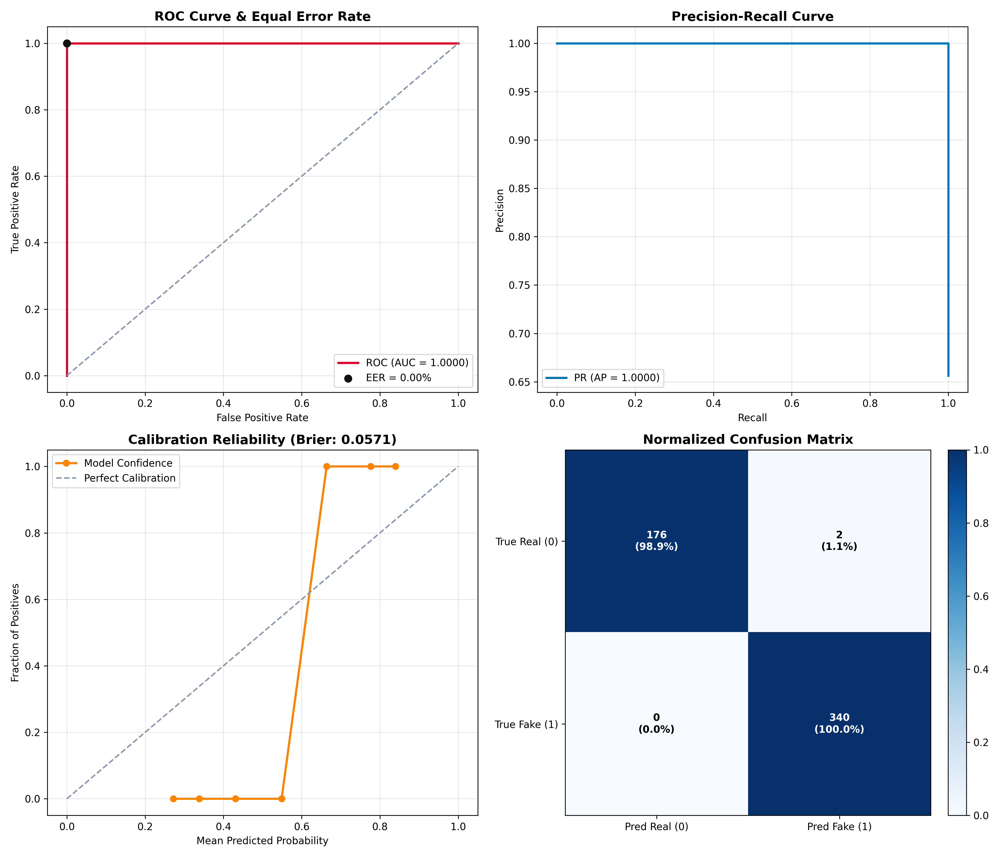


Viewing: robustness_triplet.png


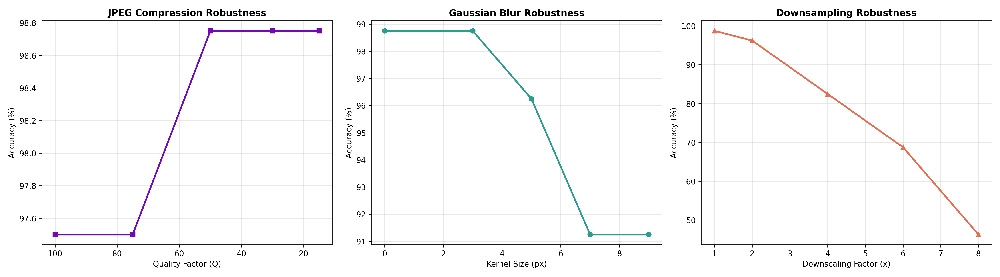


Viewing: xai_false_positive.png


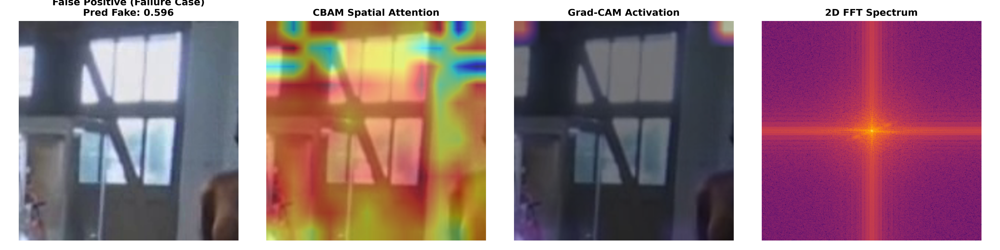


Viewing: xai_true_fake.png


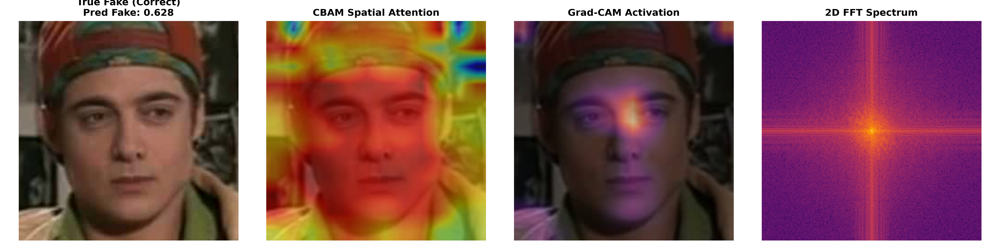


Viewing: xai_true_real.png


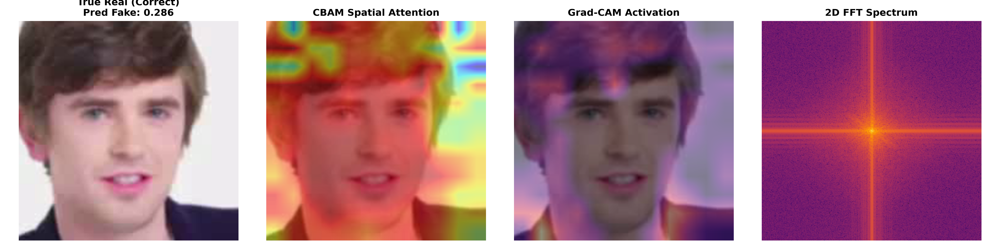

In [4]:
import os
import glob
from IPython.display import Image, display

artifact_dir = "/kaggle/working/benchmark_artifacts"
image_files = sorted(glob.glob(os.path.join(artifact_dir, "*.png")))

for img_path in image_files:
    print(f"\n{'='*70}\nViewing: {os.path.basename(img_path)}\n{'='*70}")
    display(Image(filename=img_path))

In [5]:
import os
import json

json_path = "/kaggle/working/benchmark_artifacts/metrics_summary.json"

if os.path.exists(json_path):
    with open(json_path, "r") as f:
        data = json.load(f)
    print(json.dumps(data, indent=4))
else:
    print("metrics_summary.json not found.")

{
    "Total_Videos": 518,
    "Real_Count": 178,
    "Fake_Count": 340,
    "Accuracy": 0.9961389961389961,
    "Precision": 0.9941520467836257,
    "Recall_TPR": 1.0,
    "Specificity_TNR": 0.9887640449438202,
    "F1_Score": 0.9970674486803519,
    "ROC_AUC": 1.0,
    "Average_Precision": 0.9999999999999999,
    "Equal_Error_Rate": 0.0,
    "EER_Threshold": 0.6290220703397479,
    "Brier_Score": 0.05710559748061028,
    "FPR_at_95_TPR": 0.0,
    "FPR_at_99_TPR": 0.0,
    "Confusion_Matrix": {
        "TN": 176,
        "FP": 2,
        "FN": 0,
        "TP": 340
    }
}


In [6]:
import os
import pandas as pd

csv_path = "/kaggle/working/benchmark_artifacts/predictions.csv"

if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    display(df.head(10))
    print(f"\nTotal predictions recorded: {len(df)}")

,video_path,true_label,predicted_prob_fake,predicted_label
0,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.374237,0
1,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.305978,0
2,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.472665,0
3,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.328720,0
4,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.309693,0
5,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.271641,0
6,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.313314,0
7,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.324563,0
8,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.341959,0
9,/kaggle/input/datasets/reubensuju/celeb-df-v2/...,0,0.323973,0



Total predictions recorded: 518
